## Financial Sentiment Analysis

Financial sentiment analysis, a critical aspect of financial technology, interprets and classifies the sentiments of financial data. This project aims to develop machine learning models using a combined dataset to predict financial sentiments. The data used for the implementation of the models is derived from three distinct datasets; FiQA, Financial PhraseBank and SentFIN v1.1, and were sourced from Kaggle, a renowned platform for machine learning and data science competitions. It provides financial sentences with sentiment labels. Essential textual and sentiment features are extracted from these financial sentences. Each model’s performance is evaluated and compared to determine their effectiveness in detecting financial sentiments. This analysis can provide valuable insights into market trends and investor behavior, thereby aiding in informed decision-making.

### Load Libraries

In [262]:
# To supress warnings
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import plotly.express as px
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import nltk
import string
from collections import Counter
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords, wordnet
from gensim.models import Word2Vec
from nltk.stem import WordNetLemmatizer
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.utils.validation import check_is_fitted
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectPercentile
from sklearn.metrics import (f1_score, accuracy_score, recall_score, precision_score, confusion_matrix, log_loss)
from sklearn.metrics import (roc_curve, roc_auc_score, classification_report, precision_recall_curve)
from sklearn import metrics
from sklearn.ensemble import VotingClassifier
from sklearn.svm import SVC
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import GridSearchCV, learning_curve
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_predict
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.ensemble import BaggingClassifier
from xgboost import XGBClassifier
import tensorflow as tf
from transformers import RobertaTokenizer, TFRobertaForSequenceClassification
from transformers import BertTokenizer, TFBertForSequenceClassification
import shap
from lime import lime_text
from lime.lime_text import LimeTextExplainer
import joblib
import pickle

In [261]:
# pip install gensim
# pip install wordcloud
# pip install xgboost
# pip install imblearn
# pip install seaborn
# pip install plotly
# pip install transformers
# pip install tensorflow
# pip install keras
# pip install nltk

### Import Datasets

In [12]:
# Load financial_sentiment_dataset dataset 
sentiment_data = pd.read_csv("data/financial_sentiment_dataset.csv")
sentiment_data.head()

,Sentence,Sentiment
0,The GeoSolutions technology will leverage Bene...,positive
1,"$ESI on lows, down $1.50 to $2.50 BK a real po...",negative
2,"For the last quarter of 2010 , Componenta 's n...",positive
3,According to the Finnish-Russian Chamber of Co...,neutral
4,The Swedish buyout firm has sold its remaining...,neutral


In [13]:
# get the info
sentiment_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5842 entries, 0 to 5841
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Sentence   5842 non-null   object
 1   Sentiment  5842 non-null   object
dtypes: object(2)
memory usage: 91.4+ KB


In [14]:
# get the shape
sentiment_data.shape

(5842, 2)

In [15]:
# get the value counts of the Sentiment
sentiment_data["Sentiment"].value_counts()

Sentiment
neutral     3130
positive    1852
negative     860
Name: count, dtype: int64

In [16]:
# Load SEntFiN dataset
sentfin_data = pd.read_csv("data/SEntFiN.csv")
sentfin_data.head()

,S No.,Title,Decisions,Words
0,1,SpiceJet to issue 6.4 crore warrants to promoters,{'SpiceJet': 'neutral'},8
1,2,MMTC Q2 net loss at Rs 10.4 crore,{'MMTC': 'neutral'},8
2,3,"Mid-cap funds can deliver more, stay put: Experts",{'Mid-cap funds': 'positive'},8
3,4,Mid caps now turn into market darlings,{'Mid caps': 'positive'},7
4,5,"Market seeing patience, if not conviction: Pra...",{'Market': 'neutral'},8


In [17]:
# selecting only the sentiment on the Decisions column
sentfin_data['Decisions'] = sentfin_data['Decisions'].apply(lambda x: x.split()[-1])
# Remove quotation marks and closing curly braces
sentfin_data['Decisions'] = sentfin_data['Decisions'].str.replace("'", "").str.replace("}", "")
sentfin_data.head()

,S No.,Title,Decisions,Words
0,1,SpiceJet to issue 6.4 crore warrants to promoters,neutral,8
1,2,MMTC Q2 net loss at Rs 10.4 crore,neutral,8
2,3,"Mid-cap funds can deliver more, stay put: Experts",positive,8
3,4,Mid caps now turn into market darlings,positive,7
4,5,"Market seeing patience, if not conviction: Pra...",neutral,8


In [18]:
# Removing columns 'S No.' and 'Words'
sentfin_data = sentfin_data.drop(['S No.', 'Words'], axis=1)
sentfin_data.head()

,Title,Decisions
0,SpiceJet to issue 6.4 crore warrants to promoters,neutral
1,MMTC Q2 net loss at Rs 10.4 crore,neutral
2,"Mid-cap funds can deliver more, stay put: Experts",positive
3,Mid caps now turn into market darlings,positive
4,"Market seeing patience, if not conviction: Pra...",neutral


In [19]:
# get the info
sentfin_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10753 entries, 0 to 10752
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Title      10753 non-null  object
 1   Decisions  10753 non-null  object
dtypes: object(2)
memory usage: 168.1+ KB


In [20]:
# get the shape
sentfin_data.shape

(10753, 2)

In [21]:
# get the value counts of the Decisions
sentfin_data["Decisions"].value_counts()

Decisions
neutral     4535
positive    3363
negative    2855
Name: count, dtype: int64

In [22]:
# merging the sentiment_data and sentfin_data
# Rename the columns of sentfin_data
sentfin_data.columns = ['Sentence', 'Sentiment']
# Concatenate sentiment_data and sentfin_data
merged_data = pd.concat([sentiment_data, sentfin_data], ignore_index=True)
merged_data.head()

,Sentence,Sentiment
0,The GeoSolutions technology will leverage Bene...,positive
1,"$ESI on lows, down $1.50 to $2.50 BK a real po...",negative
2,"For the last quarter of 2010 , Componenta 's n...",positive
3,According to the Finnish-Russian Chamber of Co...,neutral
4,The Swedish buyout firm has sold its remaining...,neutral


In [23]:
# make a copy of the data
sentiment_df = merged_data.copy()
sentiment_df.tail()

,Sentence,Sentiment
16590,"Negative on Chambal, Advanta: Mitesh Thacker",negative
16591,"Small, Mid-cap stocks may emerge outperformers",positive
16592,Rupee slips against US dollar,neutral
16593,Rupee weak against US dollar,neutral
16594,Australia shares flat; energy drags,neutral


In [24]:
# get the info
sentiment_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16595 entries, 0 to 16594
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Sentence   16595 non-null  object
 1   Sentiment  16595 non-null  object
dtypes: object(2)
memory usage: 259.4+ KB


In [25]:
# get the shape
sentiment_df.shape

(16595, 2)

In [26]:
# rename the column name 'Sentence' to 'Text'
sentiment_df = sentiment_df.rename(columns={'Sentence': 'Text'})
sentiment_df.head()

,Text,Sentiment
0,The GeoSolutions technology will leverage Bene...,positive
1,"$ESI on lows, down $1.50 to $2.50 BK a real po...",negative
2,"For the last quarter of 2010 , Componenta 's n...",positive
3,According to the Finnish-Russian Chamber of Co...,neutral
4,The Swedish buyout firm has sold its remaining...,neutral


In [27]:
# get the value counts of the Sentiment
sentiment_df["Sentiment"].value_counts()

Sentiment
neutral     7665
positive    5215
negative    3715
Name: count, dtype: int64

In [28]:
# check for missing values
sentiment_df.isna().sum()

Text         0
Sentiment    0
dtype: int64

In [29]:
# Check for duplicates
num_duplicates = sentiment_df.duplicated().sum()

if num_duplicates > 0:
    print(f'There are {num_duplicates} duplicate rows in the DataFrame.')
else:
    print('No duplicates found in the DataFrame.')

There are 64 duplicate rows in the DataFrame.


In [30]:
# view the duplicates
duplicate_rows = sentiment_df.duplicated()
num_duplicates = sentiment_df.duplicated().sum()
# Display duplicate rows
print("Number of duplicates:", num_duplicates)
print("Duplicate rows:")
print(sentiment_df[duplicate_rows].head())

Number of duplicates: 64
Duplicate rows:
                                                   Text Sentiment
1825  Proha Plc ( Euronext :7327 ) announced today (...   neutral
1859  SSH Communications Security Corporation is hea...   neutral
2672  Ahlstrom 's share is quoted on the NASDAQ OMX ...   neutral
3272  The company serves customers in various indust...   neutral
3986  The issuer is solely responsible for the conte...   neutral


Duplicates are around 0.004%, so were remove them

In [31]:
# Remove duplicates
sentiment_df = sentiment_df.drop_duplicates()

# Check if duplicates are removed
print("\nAfter removing duplicates:")
print(sentiment_df.head())


After removing duplicates:
                                                Text Sentiment
0  The GeoSolutions technology will leverage Bene...  positive
1  $ESI on lows, down $1.50 to $2.50 BK a real po...  negative
2  For the last quarter of 2010 , Componenta 's n...  positive
3  According to the Finnish-Russian Chamber of Co...   neutral
4  The Swedish buyout firm has sold its remaining...   neutral


In [32]:
# Verify duplicates have been removed
print("Number of duplicate rows after removal:", sentiment_df.duplicated().sum())

Number of duplicate rows after removal: 0


In [33]:
# get the value counts of the Sentiment again
sentiment_df["Sentiment"].value_counts()

Sentiment
neutral     7620
positive    5203
negative    3708
Name: count, dtype: int64

## Exploratory Data Analysis (EDA)

In [34]:
# List the contents of the different polarities
for sentiment in sentiment_df['Sentiment'].unique():
    print(f"Sentiment: {sentiment}")
    print("Text:")
    for sentence in sentiment_df[sentiment_df['Sentiment']==sentiment]['Text']:
        print(f"- {sentence}")
    print("\n")

Sentiment: positive
Text:
- The GeoSolutions technology will leverage Benefon 's GPS solutions by providing Location Based Search Technology , a Communities Platform , location relevant multimedia content and a new and powerful commercial model .
- For the last quarter of 2010 , Componenta 's net sales doubled to EUR131m from EUR76m for the same period a year earlier , while it moved to a zero pre-tax profit from a pre-tax loss of EUR7m .
- $SPY wouldn't be surprised to see a green close
- Kone 's net sales rose by some 14 % year-on-year in the first nine months of 2008 .
- Circulation revenue has increased by 5 % in Finland and 4 % in Sweden in 2008 .
- The subdivision made sales revenues last year of EUR 480.7 million EUR 414.9 million in 2008 , and operating profits of EUR 44.5 million EUR 7.4 million .
- $FB gone green on day
- $MSFT SQL Server revenue grew double-digit with SQL Server Premium revenue growing over 30% http://stks.co/ir2F
- Aviva, Friends Life top forecasts ahead of

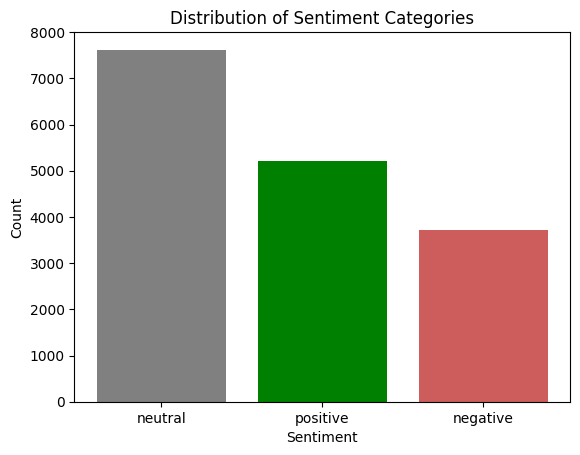

In [35]:
# Count the number of sentences for each sentiment category
sentiment_counts = sentiment_df['Sentiment'].value_counts()

# Plotting
plt.bar(sentiment_counts.index, sentiment_counts.values, color=['#808080','#008000', '#CD5C5C'])
plt.title('Distribution of Sentiment Categories')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.show()

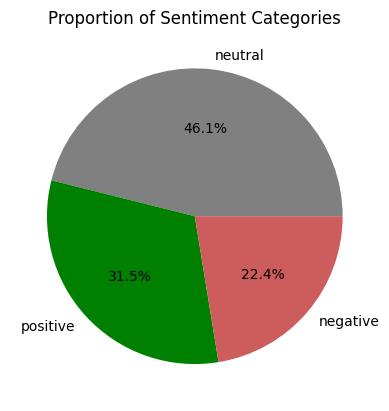

In [36]:
# Plotting the percentages
plt.pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%', colors=['#808080','#008000', '#CD5C5C' ])
plt.title('Proportion of Sentiment Categories')
plt.show()

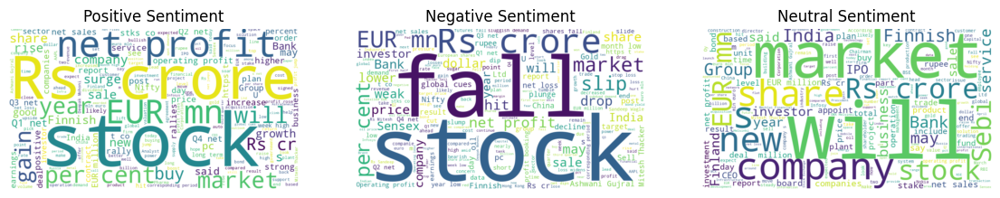

In [37]:
# Concatenate sentences for each sentiment category
positive_sentences = ' '.join(sentiment_df[sentiment_df['Sentiment'] == 'positive']['Text'])
negative_sentences = ' '.join(sentiment_df[sentiment_df['Sentiment'] == 'negative']['Text'])
neutral_sentences = ' '.join(sentiment_df[sentiment_df['Sentiment'] == 'neutral']['Text'])

# Generate word clouds
positive_cloud = WordCloud(width=900, height=500, background_color='white').generate(positive_sentences)
negative_cloud = WordCloud(width=900, height=500, background_color='white').generate(negative_sentences)
neutral_cloud = WordCloud(width=900, height=500, background_color='white').generate(neutral_sentences)

# Plotting
plt.figure(figsize=(14, 10))
plt.subplot(1, 3, 1)
plt.imshow(positive_cloud, interpolation='bilinear')
plt.title('Positive Sentiment')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(negative_cloud, interpolation='bilinear')
plt.title('Negative Sentiment')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(neutral_cloud, interpolation='bilinear')
plt.title('Neutral Sentiment')
plt.axis('off')

plt.show()

## Text Preprocessing

In [38]:
# # Download NLTK resources (if necessary)
# nltk.download('punkt')
# nltk.download('averaged_perceptron_tagger')
# nltk.download('wordnet')
# nltk.download('stopwords')

In [39]:
# Initialize lemmatizer
lemmatizer = WordNetLemmatizer()

# Define a function for text preprocessing
def preprocess_text(text):
    # Convert text to lowercase
    text = text.lower()
    # Remove punctuation but keep numbers
    text = ''.join(ch for ch in text if ch not in string.punctuation)
    
    # Tokenization
    words = nltk.word_tokenize(text)

    # Stopword removal
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word not in stop_words]

    # Lemmatization
    words = [lemmatizer.lemmatize(word) for word in words]
    
    return ' '.join(words)

# Apply the function to the 'Text' column
sentiment_df['Text'] = sentiment_df['Text'].apply(preprocess_text)

# Remove rows where the 'Text' column has just one word
sentiment_df = sentiment_df[sentiment_df['Text'].apply(lambda x: len(x.split()) > 1)]

In [40]:
# view the head
sentiment_df.head()

,Text,Sentiment
0,geosolutions technology leverage benefon gps s...,positive
1,esi low 150 250 bk real possibility,negative
2,last quarter 2010 componenta net sale doubled ...,positive
3,according finnishrussian chamber commerce majo...,neutral
4,swedish buyout firm sold remaining 224 percent...,neutral


In [41]:
# List the cleaned contents of the different polarities
for sentiment in sentiment_df['Sentiment'].unique():
    print(f"Sentiment: {sentiment}")
    print("Text:")
    for sentence in sentiment_df[sentiment_df['Sentiment']==sentiment]['Text']:
        print(f"- {sentence}")
    print("\n")

Sentiment: positive
Text:
- geosolutions technology leverage benefon gps solution providing location based search technology community platform location relevant multimedia content new powerful commercial model
- last quarter 2010 componenta net sale doubled eur131m eur76m period year earlier moved zero pretax profit pretax loss eur7m
- spy wouldnt surprised see green close
- kone net sale rose 14 yearonyear first nine month 2008
- circulation revenue increased 5 finland 4 sweden 2008
- subdivision made sale revenue last year eur 4807 million eur 4149 million 2008 operating profit eur 445 million eur 74 million
- fb gone green day
- msft sql server revenue grew doubledigit sql server premium revenue growing 30 httpstkscoir2f
- aviva friend life top forecast ahead 56 billion pound merger
- shire ceo step drive get baxalta board talking
- costco premier retail dividend play httpstcofa5cnh2t0t cost
- stockmann swedish sector company ab lindex entered agreement september 30 2007 whereby st

In [42]:
# Tokenize text and count word frequencies
word_counts = Counter()
for text in sentiment_df['Text']:
    words = nltk.word_tokenize(text)
    word_counts.update(words)

# Get the most common words
most_common_words = word_counts.most_common(10)  

print("Most frequent words:")
for word, count in most_common_words:
    print(f"{word}: {count}")


Most frequent words:
r: 1597
net: 1419
stock: 1388
eur: 1284
profit: 1176
share: 1173
company: 1166
crore: 945
market: 925
sale: 786


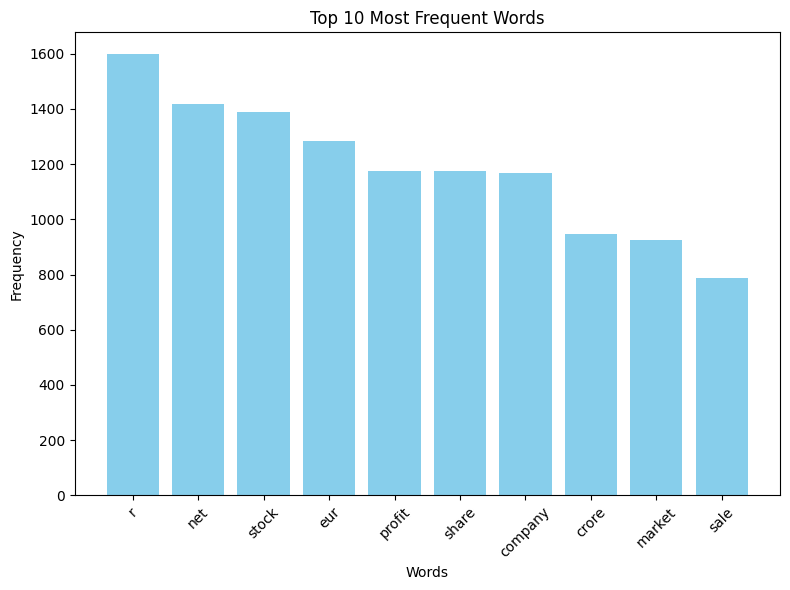

In [43]:
# Extract words and counts for plotting
words, counts = zip(*most_common_words)

# Create a bar plot
plt.figure(figsize=(8, 6))
plt.bar(words, counts, color='#87CEEB')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 10 Most Frequent Words')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [44]:
# Encode Sentiment Column
label_encoder = LabelEncoder()
sentiment_df['Sentiment_encoded'] = label_encoder.fit_transform(sentiment_df['Sentiment'])

# Remove the original Sentiment column
sentiment_df.drop(columns=['Sentiment'], inplace=True)

In [45]:
# view the head
sentiment_df.head()

,Text,Sentiment_encoded
0,geosolutions technology leverage benefon gps s...,2
1,esi low 150 250 bk real possibility,0
2,last quarter 2010 componenta net sale doubled ...,2
3,according finnishrussian chamber commerce majo...,1
4,swedish buyout firm sold remaining 224 percent...,1


## Feature Engineering and Feature Selection


### Extracting with BOW

In [46]:
# Bag-of-Words (BoW) representation
bow_vectorizer = CountVectorizer()
bow_matrix = bow_vectorizer.fit_transform(sentiment_df['Text'])
bow_df = pd.DataFrame(bow_matrix.toarray(), columns=bow_vectorizer.get_feature_names_out())

In [47]:
# view the head
bow_df.head()

,00,000,000063,0008,001,002,0025,003,0030,004,...,zurich,zydus,zyl,zylog,àkersberga,àland,àlandsbanken,àmñl,ál,äñnekoski
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [48]:
# Applying SelectKBest for feature selection
selector = SelectKBest(chi2, k=2100)  
y = sentiment_df['Sentiment_encoded']
bow_df_selected = selector.fit_transform(bow_df, y)

In [49]:
# assign bow_df_selected to training features 
X = bow_df_selected 
# Splitting Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Extracting with TF-IDF

In [50]:
# TF-IDF representation
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(sentiment_df['Text'])
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

In [51]:
# view the head
tfidf_df.head()

,00,000,000063,0008,001,002,0025,003,0030,004,...,zurich,zydus,zyl,zylog,àkersberga,àland,àlandsbanken,àmñl,ál,äñnekoski
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [52]:
# Applying SelectKBest for feature selection
selector = SelectKBest(chi2, k=2100) 
y = sentiment_df['Sentiment_encoded']
tfidf_df_selected = selector.fit_transform(tfidf_df, y)

In [53]:
# assign bow_df_selected to training features 
X = tfidf_df_selected 
# Splitting Data
X_train_t, X_test_t, y_train_t, y_test_t = train_test_split(X, y, test_size=0.2, random_state=42)

## Model Training

In [54]:
# function to visualize the metrics
def metrics_score(actual, predicted):
    class_names = ['Negative', 'Neutral', 'Positive']
    print(classification_report(actual, predicted, target_names=class_names))
    cm = confusion_matrix(actual, predicted)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='.2f', xticklabels=class_names, yticklabels=class_names, cmap="crest")
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

In [55]:
# Cross validate model with Kfold stratified cross val
kfold = StratifiedKFold(n_splits=4)
kfold

StratifiedKFold(n_splits=4, random_state=None, shuffle=False)

### Train with BOW

#### Logistic Regression

In [56]:
# Define parameter grids for Logistic Regression
C = np.logspace(-2, 1, 20)
param_grid_lr = {
    'penalty': ['l1', 'l2'], 
    'C': C                    
}

# Instantiate Logistic Regression classifier
lr = LogisticRegression(max_iter=1000)  

# Use GridSearchCV with a larger k for k-fold cross-validation
grid_lr = GridSearchCV(lr, param_grid_lr, cv=kfold, scoring='accuracy', n_jobs=2, verbose=1)

# Fit the model
bow_lr = grid_lr.fit(X_train, y_train)

# Get the best estimator
lr_best = bow_lr.best_estimator_

# Get best parameters and best score
print("Logistic Regression:", bow_lr.best_params_, bow_lr.best_score_)

# View best hyperparameters
print('Best Penalty:', lr_best.get_params()['penalty'])
print('Best C:', lr_best.get_params()['C'])

# Best score
print('Best score:', bow_lr.best_score_)

Fitting 4 folds for each of 40 candidates, totalling 160 fits
Logistic Regression: {'C': 0.7847599703514611, 'penalty': 'l2'} 0.7388804841149773
Best Penalty: l2
Best C: 0.7847599703514611
Best score: 0.7388804841149773


              precision    recall  f1-score   support

    Negative       0.73      0.60      0.66       751
     Neutral       0.76      0.81      0.78      1565
    Positive       0.73      0.73      0.73       989

    accuracy                           0.74      3305
   macro avg       0.74      0.72      0.72      3305
weighted avg       0.74      0.74      0.74      3305



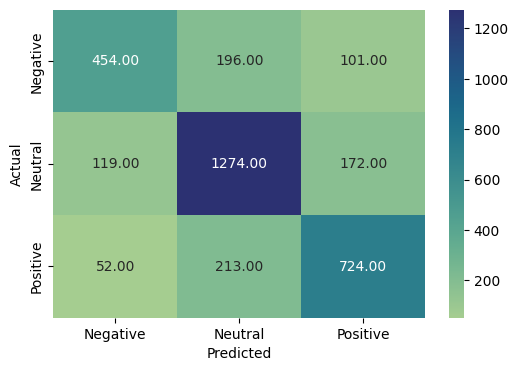

In [57]:
# Make predictions on the testing set
y_pred_blr = bow_lr.predict(X_test)
# Evaluate the predictions
metrics_score(y_test, y_pred_blr)

#### SVM

In [84]:
# Define parameter grid for SVM
param_grid_svm = {
    'C': [0.1, 1, 10, 100],             
    'kernel': ['linear', 'rbf', 'poly'], 
    'gamma': ['scale', 'auto'],          
    'degree': [2, 3, 4]                  
}

# Instantiate SVM classifier
svm = SVC()

# Use GridSearchCV for hyperparameter tuning
grid_svm = GridSearchCV(svm, param_grid_svm, cv=kfold, scoring='accuracy', n_jobs=-1, verbose=1)

# Fit the model
bow_svm = grid_svm.fit(X_train, y_train)

# Get the best estimator
svm_best = bow_svm.best_estimator_

# Get best parameters and best score
print("Support Vector Machine:", bow_svm.best_params_, bow_svm.best_score_)

# View best hyperparameters
print('Best C:', svm_best.get_params()['C'])
print('Best kernel:', svm_best.get_params()['kernel'])
print('Best gamma:', svm_best.get_params()['gamma'])
print('Best degree:', svm_best.get_params()['degree'])

# Best score
print('Best score:', bow_svm.best_score_)

Fitting 4 folds for each of 72 candidates, totalling 288 fits
Support Vector Machine: {'C': 1, 'degree': 2, 'gamma': 'scale', 'kernel': 'linear'} 0.7275340393343419
Best C: 1
Best kernel: linear
Best gamma: scale
Best degree: 2
Best score: 0.7275340393343419


              precision    recall  f1-score   support

    Negative       0.70      0.63      0.66       751
     Neutral       0.75      0.80      0.78      1565
    Positive       0.74      0.71      0.72       989

    accuracy                           0.74      3305
   macro avg       0.73      0.71      0.72      3305
weighted avg       0.74      0.74      0.73      3305



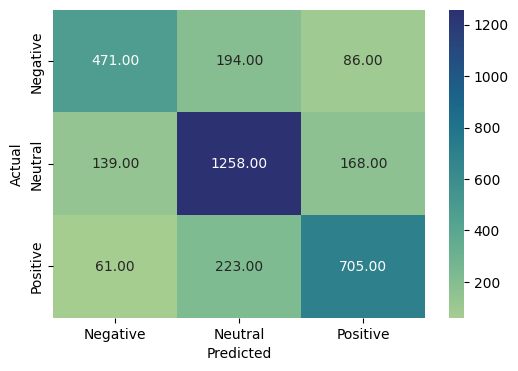

In [85]:
# Make predictions on the testing set
y_pred_bsvm = bow_svm.predict(X_test)
# Evaluate the predictions
metrics_score(y_test, y_pred_bsvm)

#### XGBoost

In [86]:
# Define parameter grid for XGBoost
param_grid_xgb = {
    'learning_rate': [0.1, 0.01],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300]
}

# Instantiate XGBoost classifier
xgb = XGBClassifier()

# Use GridSearchCV with a larger k for k-fold cross-validation
grid_xgb = GridSearchCV(xgb, param_grid_xgb, cv=kfold, scoring='accuracy', n_jobs=2, verbose=1)

# Fit XGBoost model
bow_xgb = grid_xgb.fit(X_train, y_train)
xgb_best = bow_xgb.best_estimator_

# Get best parameters and best scores
print("XGBoost:", bow_xgb.best_params_, bow_xgb.best_score_)

# View best hyperparameters
print('Best learning rate:', xgb_best.get_params()['learning_rate'])
print('Best max depth:', xgb_best.get_params()['max_depth'])
print('Best n_estimators:', xgb_best.get_params()['n_estimators'])

# Best score
print('Best score:', bow_xgb.best_score_)

Fitting 4 folds for each of 18 candidates, totalling 72 fits
XGBoost: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300} 0.707715582450832
Best learning rate: 0.1
Best max depth: 7
Best n_estimators: 300
Best score: 0.707715582450832


              precision    recall  f1-score   support

    Negative       0.76      0.54      0.63       751
     Neutral       0.69      0.86      0.77      1565
    Positive       0.73      0.61      0.67       989

    accuracy                           0.71      3305
   macro avg       0.73      0.67      0.69      3305
weighted avg       0.72      0.71      0.71      3305



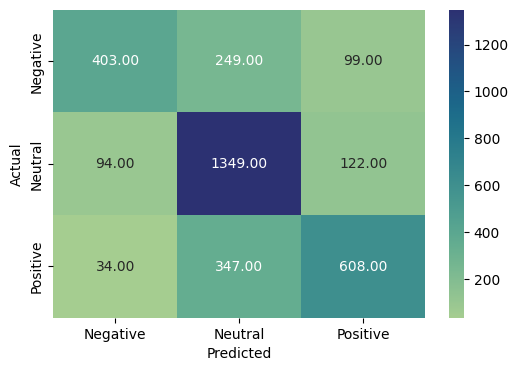

In [87]:
# Make predictions on the testing set
y_pred_bxgb = bow_xgb.predict(X_test)
# Evaluate the predictions
metrics_score(y_test, y_pred_bxgb)

### Train with TF-IDF

#### Logistic Regression

In [88]:
# Define parameter grids for Logistic Regression
C = np.logspace(-2, 1, 20)
param_grid_lr = {
    'penalty': ['l1', 'l2'], 
    'C': C                    
}

# Instantiate Logistic Regression classifier
lr = LogisticRegression(max_iter=1000)  

# Use GridSearchCV with a larger k for k-fold cross-validation
grid_lr = GridSearchCV(lr, param_grid_lr, cv=kfold, scoring='accuracy', n_jobs=2, verbose=1)

# Fit the model
tdidf_lr = grid_lr.fit(X_train_t, y_train_t)

# Get the best estimator
lr_best = tdidf_lr.best_estimator_

# Get best parameters and best score
print("Logistic Regression:", tdidf_lr.best_params_, tdidf_lr.best_score_)

# View best hyperparameters
print('Best Penalty:', lr_best.get_params()['penalty'])
print('Best C:', lr_best.get_params()['C'])

# Best score
print('Best score:', tdidf_lr.best_score_)

Fitting 4 folds for each of 40 candidates, totalling 160 fits
Logistic Regression: {'C': 4.832930238571752, 'penalty': 'l2'} 0.7433434190620273
Best Penalty: l2
Best C: 4.832930238571752
Best score: 0.7433434190620273


              precision    recall  f1-score   support

    Negative       0.75      0.61      0.67       751
     Neutral       0.75      0.83      0.79      1565
    Positive       0.74      0.72      0.73       989

    accuracy                           0.75      3305
   macro avg       0.74      0.72      0.73      3305
weighted avg       0.75      0.75      0.74      3305



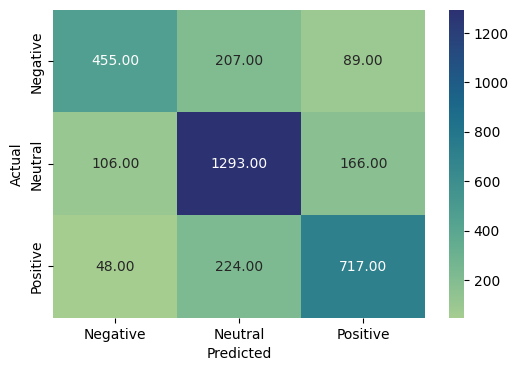

In [89]:
# Make predictions on the testing set
y_pred_tdlr = tdidf_lr.predict(X_test_t)
# Evaluate the predictions
metrics_score(y_test_t, y_pred_tdlr)

#### SVM

In [90]:
# Define parameter grid for SVM
param_grid_svm = {
    'C': [0.1, 1, 10, 100],              # Regularization parameter
    'kernel': ['linear', 'rbf', 'poly'], # Kernel type
    'gamma': ['scale', 'auto'],          # Kernel coefficient for 'rbf' and 'poly' kernels
    'degree': [2, 3, 4]                  # Degree of the polynomial kernel
}

# Instantiate SVM classifier
svm = SVC()

# Use GridSearchCV for hyperparameter tuning
grid_svm = GridSearchCV(svm, param_grid_svm, cv=kfold, scoring='accuracy', n_jobs=-1, verbose=1)

# Fit the model
tdidf_svm = grid_svm.fit(X_train_t, y_train_t)

# Get the best estimator
svm_best = tdidf_svm.best_estimator_

# Get best parameters and best score
print("Support Vector Machine:", tdidf_svm.best_params_, tdidf_svm.best_score_)

# View best hyperparameters
print('Best C:', svm_best.get_params()['C'])
print('Best kernel:', svm_best.get_params()['kernel'])
print('Best gamma:', svm_best.get_params()['gamma'])
print('Best degree:', svm_best.get_params()['degree'])

# Best score
print('Best score:', tdidf_svm.best_score_)

Fitting 4 folds for each of 72 candidates, totalling 288 fits
Support Vector Machine: {'C': 1, 'degree': 2, 'gamma': 'scale', 'kernel': 'rbf'} 0.7437216338880485
Best C: 1
Best kernel: rbf
Best gamma: scale
Best degree: 2
Best score: 0.7437216338880485


              precision    recall  f1-score   support

    Negative       0.76      0.60      0.67       751
     Neutral       0.74      0.85      0.79      1565
    Positive       0.77      0.72      0.74       989

    accuracy                           0.75      3305
   macro avg       0.76      0.72      0.73      3305
weighted avg       0.75      0.75      0.75      3305



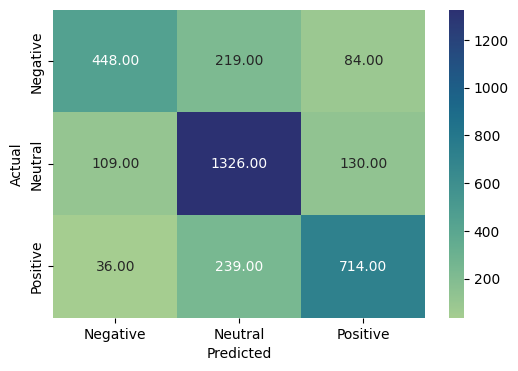

In [91]:
# Make predictions on the testing set
y_pred_tdsvm = tdidf_svm.predict(X_test_t)
# Evaluate the predictions
metrics_score(y_test_t, y_pred_tdsvm)

### XGBoost

In [92]:
# Define parameter grid for XGBoost
param_grid_xgb = {
    'learning_rate': [0.1, 0.01],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300]
}

# Instantiate XGBoost classifier
xgb = XGBClassifier()

# Use GridSearchCV with a larger k for k-fold cross-validation
grid_xgb = GridSearchCV(xgb, param_grid_xgb, cv=kfold, scoring='accuracy', n_jobs=2, verbose=1)

# Fit XGBoost model
tdidf_xgb = grid_xgb.fit(X_train_t, y_train_t)
xgb_best = tdidf_xgb.best_estimator_

# Get best parameters and best scores
print("XGBoost:", tdidf_xgb.best_params_, tdidf_xgb.best_score_)

# View best hyperparameters
print('Best learning rate:', xgb_best.get_params()['learning_rate'])
print('Best max depth:', xgb_best.get_params()['max_depth'])
print('Best n_estimators:', xgb_best.get_params()['n_estimators'])

# Best score
print('Best score:', tdidf_xgb.best_score_)

Fitting 4 folds for each of 18 candidates, totalling 72 fits
XGBoost: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300} 0.7004538577912254
Best learning rate: 0.1
Best max depth: 7
Best n_estimators: 300
Best score: 0.7004538577912254


              precision    recall  f1-score   support

    Negative       0.76      0.52      0.62       751
     Neutral       0.69      0.86      0.76      1565
    Positive       0.73      0.61      0.66       989

    accuracy                           0.71      3305
   macro avg       0.72      0.66      0.68      3305
weighted avg       0.71      0.71      0.70      3305



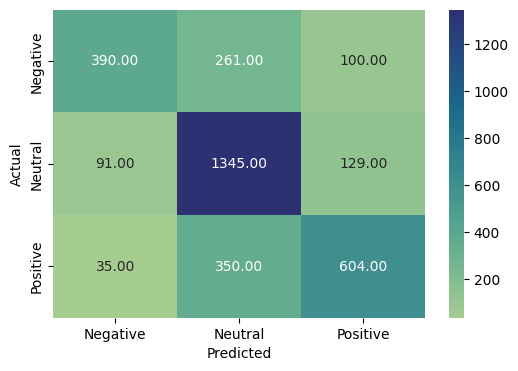

In [93]:
# Make predictions on the testing set
y_pred_tdxgb = tdidf_xgb.predict(X_test_t)
# Evaluate the predictions
metrics_score(y_test_t, y_pred_tdxgb)

### Ensemble BOW and TD-IDF Models

#### Logistic Regression

In [94]:
# Define base models
base_models = [
    ('bow_lr', bow_lr.best_estimator_),     
    ('tfidf_lr', tdidf_lr.best_estimator_) 
]

# Define ensemble method
ensemble = VotingClassifier(base_models, voting='soft')

# Evaluate the ensemble using cross-validation
ensemble_cv_scores = cross_val_score(ensemble, X_train_t, y_train_t, cv=kfold, scoring='accuracy')

# Train ensemble on full data
lr_combined = ensemble.fit(X_train_t, y_train_t)

# Evaluate ensemble performance
ensemble_test_score = lr_combined.score(X_test_t, y_test_t)

print("Ensemble CV Scores:", ensemble_cv_scores)
print("Ensemble Test Score:", ensemble_test_score)


Ensemble CV Scores: [0.73524962 0.73313162 0.75068079 0.73706505]
Ensemble Test Score: 0.745839636913767


              precision    recall  f1-score   support

    Negative       0.77      0.57      0.66       751
     Neutral       0.74      0.84      0.79      1565
    Positive       0.74      0.72      0.73       989

    accuracy                           0.75      3305
   macro avg       0.75      0.71      0.73      3305
weighted avg       0.75      0.75      0.74      3305



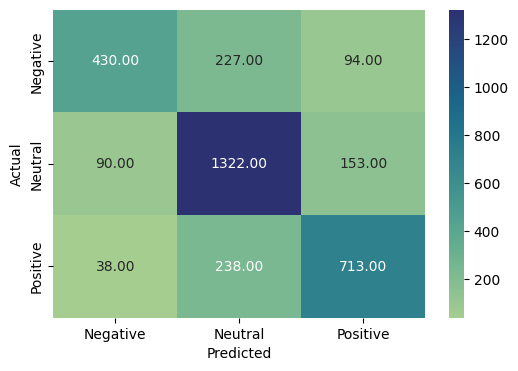

In [95]:
# Make predictions on the testing set
y_pred_lrcbd = lr_combined.predict(X_test_t)
# Evaluate the predictions
metrics_score(y_test_t, y_pred_lrcbd)

#### SVM

In [96]:
# Define base models
base_models_svm = [
    ('bow_svm', SVC(probability=True, **grid_svm.best_params_)),
    ('tfidf_svm', SVC(probability=True, **grid_svm.best_params_)) 
]

# Define ensemble method
ensemble_svm = VotingClassifier(base_models_svm, voting='soft')

# Evaluate the ensemble using cross-validation
ensemble_cv_scores_svm = cross_val_score(ensemble_svm, X_train_t, y_train_t, cv=kfold, scoring='accuracy')

# Train ensemble on full data
svm_combined = ensemble_svm.fit(X_train_t, y_train_t)

# Evaluate ensemble performance
ensemble_test_score_svm = svm_combined.score(X_test_t, y_test_t)

print("Ensemble CV Scores (SVM):", ensemble_cv_scores_svm)
print("Ensemble Test Score (SVM):", ensemble_test_score_svm)

Ensemble CV Scores (SVM): [0.74039334 0.74553707 0.74826021 0.74432678]
Ensemble Test Score (SVM): 0.7537065052950076


              precision    recall  f1-score   support

    Negative       0.72      0.63      0.67       751
     Neutral       0.76      0.83      0.79      1565
    Positive       0.76      0.73      0.75       989

    accuracy                           0.75      3305
   macro avg       0.75      0.73      0.74      3305
weighted avg       0.75      0.75      0.75      3305



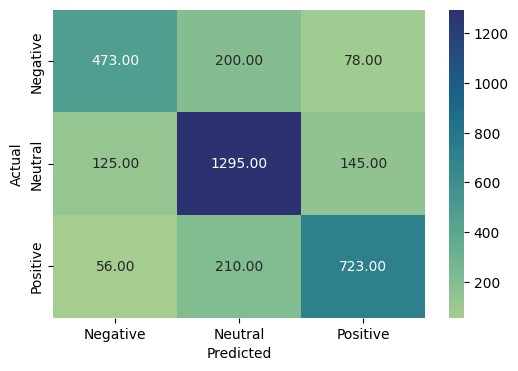

In [97]:
# Make predictions on the testing set
y_pred_svmcbd = svm_combined.predict(X_test_t)
# Evaluate the predictions
metrics_score(y_test_t, y_pred_svmcbd)

#### XGBoost

In [98]:
# Define base models
base_models_xgb = [
    ('bow_xgb', bow_xgb.best_estimator_),     
    ('tfidf_xgb', tdidf_xgb.best_estimator_) 
]

# Define ensemble method
ensemble_xgb = VotingClassifier(base_models_xgb, voting='soft')

# Evaluate the ensemble using cross-validation
ensemble_cv_scores_xgb = cross_val_score(ensemble_xgb, X_train_t, y_train_t, cv=kfold, scoring='accuracy')

# Train ensemble on full data
xgb_combined = ensemble_xgb.fit(X_train_t, y_train_t)

# Evaluate ensemble performance
ensemble_test_score_xgb = xgb_combined.score(X_test_t, y_test_t)

print("Ensemble CV Scores (XGBoost):", ensemble_cv_scores_xgb)
print("Ensemble Test Score (XGBoost):", ensemble_test_score_xgb)

Ensemble CV Scores (XGBoost): [0.69712557 0.69319213 0.70983359 0.70166415]
Ensemble Test Score (XGBoost): 0.7077155824508321


              precision    recall  f1-score   support

    Negative       0.76      0.52      0.62       751
     Neutral       0.69      0.86      0.76      1565
    Positive       0.73      0.61      0.66       989

    accuracy                           0.71      3305
   macro avg       0.72      0.66      0.68      3305
weighted avg       0.71      0.71      0.70      3305



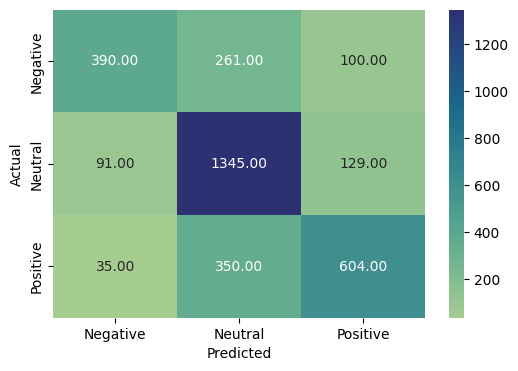

In [99]:
# Make predictions on the testing set
y_pred_xgbcbd = xgb_combined .predict(X_test_t)
# Evaluate the predictions
metrics_score(y_test_t, y_pred_xgbcbd)

### Train BERT, RoBERT and FinBERT Models

##

#### BERT

In [126]:
# Splitting the dataset into train, validation, and test sets
train_text, test_text, train_labels, test_labels = train_test_split(sentiment_df['Text'], sentiment_df['Sentiment_encoded'], test_size=0.2, random_state=42)
train_text, val_text, train_labels, val_labels = train_test_split(train_text, train_labels, test_size=0.2, random_state=42)

# Load BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Tokenize input text
train_encodings = tokenizer(list(train_text.values), truncation=True, padding=True)
val_encodings = tokenizer(list(val_text.values), truncation=True, padding=True)
test_encodings = tokenizer(list(test_text.values), truncation=True, padding=True)

# Create TensorFlow datasets
train_dataset = tf.data.Dataset.from_tensor_slices((
    dict(train_encodings),
    train_labels.astype(np.int32)  
))

val_dataset = tf.data.Dataset.from_tensor_slices((
    dict(val_encodings),
    val_labels.astype(np.int32)  
))

test_dataset = tf.data.Dataset.from_tensor_slices((
    dict(test_encodings),
    test_labels.astype(np.int32)  
))

# Define the BERT model for sequence classification
bert_model = TFBertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=len(np.unique(train_labels)))

def custom_loss(y_true, y_pred):
    # y_pred are the logits
    logits = y_pred
    loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    return loss_fn(y_true, logits)


# Compile the model with the custom loss function
optimizer = tf.keras.optimizers.Adam(learning_rate=2e-5)
bert_model.compile(optimizer=optimizer, loss=custom_loss, metrics=['accuracy'])

# Train the model
bert_model.fit(train_dataset.shuffle(1000).batch(16), epochs=6, batch_size=16, validation_data=val_dataset.shuffle(1000).batch(16))

# Evaluate the model
results = bert_model.evaluate(test_dataset.batch(16))
print("Test loss:", results[0])
print("Test accuracy:", results[1])


All PyTorch model weights were used when initializing TFBertForSequenceClassification.

Some weights or buffers of the TF 2.0 model TFBertForSequenceClassification were not initialized from the PyTorch model and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/6
661/661 [==============================] - 1585s 2s/step - loss: 0.7526 - accuracy: 0.6683 - val_loss: 0.6358 - val_accuracy: 0.7110
Epoch 2/6
661/661 [==============================] - 1492s 2s/step - loss: 0.4918 - accuracy: 0.8010 - val_loss: 0.5598 - val_accuracy: 0.7636
Epoch 3/6
661/661 [==============================] - 1484s 2s/step - loss: 0.3272 - accuracy: 0.8679 - val_loss: 0.6251 - val_accuracy: 0.7621
Epoch 4/6
661/661 [==============================] - 1482s 2s/step - loss: 0.2221 - accuracy: 0.9075 - val_loss: 0.7669 - val_accuracy: 0.7530
Epoch 5/6
661/661 [==============================] - 1488s 2s/step - loss: 0.1621 - accuracy: 0.9304 - val_loss: 0.9029 - val_accuracy: 0.7424
Epoch 6/6
207/207 [==============================] - 69s 323ms/step - l

In [103]:
# Load BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Tokenize input text
train_encodings = tokenizer(list(train_text.values), truncation=True, padding=True)
val_encodings = tokenizer(list(val_text.values), truncation=True, padding=True)
test_encodings = tokenizer(list(test_text.values), truncation=True, padding=True)

# Create TensorFlow datasets
train_dataset = tf.data.Dataset.from_tensor_slices((
    dict(train_encodings),
    train_labels.astype(np.int32)  
))

val_dataset = tf.data.Dataset.from_tensor_slices((
    dict(val_encodings),
    val_labels.astype(np.int32)  
))

test_dataset = tf.data.Dataset.from_tensor_slices((
    dict(test_encodings),
    test_labels.astype(np.int32)  
))
# Evaluate the model
results = bert_model.evaluate(test_dataset.batch(16))
print("Test loss:", results[0])
print("Test accuracy:", results[1])

207/207 [==============================] - 69s 336ms/step - loss: 1.0620 - accuracy: 0.7068
Test loss: 1.0619710683822632
Test accuracy: 0.7068078517913818


207/207 [==============================] - 67s 315ms/step
              precision    recall  f1-score   support

    Negative       0.62      0.76      0.68       751
     Neutral       0.80      0.73      0.77      1565
    Positive       0.73      0.71      0.72       989

    accuracy                           0.73      3305
   macro avg       0.72      0.73      0.72      3305
weighted avg       0.74      0.73      0.73      3305



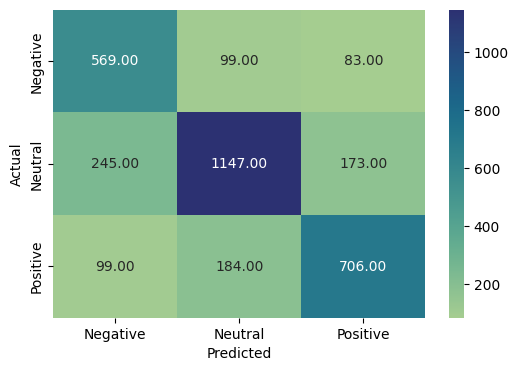

In [154]:
# Make predictions on the testing set
y_pred_bert_bt = bert_model.predict(test_dataset.batch(16))

# Convert logits to predicted labels
y_pred_bert_labels_bt = np.argmax(y_pred_bert_bt.logits, axis=1)

# Evaluate the predictions
metrics_score(test_labels, y_pred_bert_labels_bt)

#### RoBERTa

In [128]:
# Load RoBERTa tokenizer
tokenizer = RobertaTokenizer.from_pretrained('roberta-base')

# Tokenize input text
train_encodings = tokenizer(list(train_text.values), truncation=True, padding=True)
val_encodings = tokenizer(list(val_text.values), truncation=True, padding=True)
test_encodings = tokenizer(list(test_text.values), truncation=True, padding=True)

# Create TensorFlow datasets
train_dataset = tf.data.Dataset.from_tensor_slices((
    dict(train_encodings),
    train_labels.astype(np.int32)  
))

val_dataset = tf.data.Dataset.from_tensor_slices((
    dict(val_encodings),
    val_labels.astype(np.int32)  
))

test_dataset = tf.data.Dataset.from_tensor_slices((
    dict(test_encodings),
    test_labels.astype(np.int32)  
))

# Define the RoBERTa model for sequence classification
roberta_model = TFRobertaForSequenceClassification.from_pretrained('roberta-base', num_labels=len(np.unique(train_labels)))

def custom_loss(y_true, y_pred):
    # y_pred are the logits
    logits = y_pred
    loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    return loss_fn(y_true, logits)


# Compile the model with the custom loss function
optimizer = tf.keras.optimizers.Adam(learning_rate=2e-5)
roberta_model.compile(optimizer=optimizer, loss=custom_loss, metrics=['accuracy'])

# Train the model
roberta_model.fit(train_dataset.shuffle(1000).batch(16), epochs=6, batch_size=16, validation_data=val_dataset.shuffle(1000).batch(16))

# Evaluate the model
results = roberta_model.evaluate(test_dataset.batch(16))
print("Test loss:", results[0])
print("Test accuracy:", results[1])


Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFRobertaForSequenceClassification: ['roberta.embeddings.position_ids']
- This IS expected if you are initializing TFRobertaForSequenceClassification from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFRobertaForSequenceClassification from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFRobertaForSequenceClassification were not initialized from the PyTorch model and are newly initialized: ['classifier.dense.weight', 'classifier.dense.bias', 'classifier.out_proj.weight', 'classifier.out_proj.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predicti

Epoch 1/6
661/661 [==============================] - 1438s 2s/step - loss: 0.7312 - accuracy: 0.6819 - val_loss: 0.6038 - val_accuracy: 0.7504
Epoch 2/6
661/661 [==============================] - 1422s 2s/step - loss: 0.5337 - accuracy: 0.7802 - val_loss: 0.5755 - val_accuracy: 0.7526
Epoch 3/6
661/661 [==============================] - 1370s 2s/step - loss: 0.4427 - accuracy: 0.8206 - val_loss: 0.5942 - val_accuracy: 0.7708
Epoch 4/6
661/661 [==============================] - 1360s 2s/step - loss: 0.3605 - accuracy: 0.8551 - val_loss: 0.6450 - val_accuracy: 0.7761
Epoch 5/6
661/661 [==============================] - 1377s 2s/step - loss: 0.2899 - accuracy: 0.8813 - val_loss: 0.6303 - val_accuracy: 0.7772
Epoch 6/6
207/207 [==============================] - 85s 399ms/step - l

In [159]:
# Load RoBERTa tokenizer
tokenizer = RobertaTokenizer.from_pretrained('roberta-base')

# Tokenize input text
train_encodings = tokenizer(list(train_text.values), truncation=True, padding=True)
val_encodings = tokenizer(list(val_text.values), truncation=True, padding=True)
test_encodings = tokenizer(list(test_text.values), truncation=True, padding=True)

# Create TensorFlow datasets
train_dataset = tf.data.Dataset.from_tensor_slices((
    dict(train_encodings),
    train_labels.astype(np.int32)  
))

val_dataset = tf.data.Dataset.from_tensor_slices((
    dict(val_encodings),
    val_labels.astype(np.int32)  
))

test_dataset = tf.data.Dataset.from_tensor_slices((
    dict(test_encodings),
    test_labels.astype(np.int32)  
))
# Evaluate the model
results = roberta_model.evaluate(test_dataset.batch(16))
print("Test loss:", results[0])
print("Test accuracy:", results[1])

207/207 [==============================] - 77s 370ms/step - loss: 0.7484 - accuracy: 0.7619
Test loss: 0.7483707070350647
Test accuracy: 0.7618759274482727


207/207 [==============================] - 76s 368ms/step
              precision    recall  f1-score   support

    Negative       0.76      0.66      0.71       751
     Neutral       0.78      0.80      0.79      1565
    Positive       0.73      0.78      0.76       989

    accuracy                           0.76      3305
   macro avg       0.76      0.75      0.75      3305
weighted avg       0.76      0.76      0.76      3305



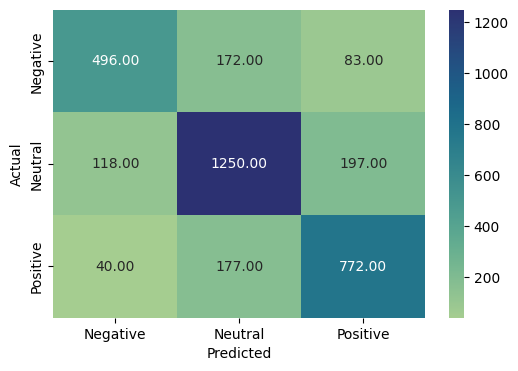

In [160]:
# Make predictions on the testing set
y_pred_bert_rob = roberta_model.predict(test_dataset.batch(16))

# Convert logits to predicted labels
y_pred_bert_labels_rob = np.argmax(y_pred_bert_rob.logits, axis=1)

# Evaluate the predictions
metrics_score(test_labels, y_pred_bert_labels_rob)

#### FinBERT

In [138]:
# Load FinBERT tokenizer
tokenizer = BertTokenizer.from_pretrained('yiyanghkust/finbert-tone')

# Tokenize input text
train_encodings = tokenizer(list(train_text.values), truncation=True, padding=True)
val_encodings = tokenizer(list(val_text.values), truncation=True, padding=True)
test_encodings = tokenizer(list(test_text.values), truncation=True, padding=True)

# Create TensorFlow datasets
train_dataset = tf.data.Dataset.from_tensor_slices((
    dict(train_encodings),
    train_labels.astype(np.int32)  
))

val_dataset = tf.data.Dataset.from_tensor_slices((
    dict(val_encodings),
    val_labels.astype(np.int32) 
))

test_dataset = tf.data.Dataset.from_tensor_slices((
    dict(test_encodings),
    test_labels.astype(np.int32)  
))

# Define the FinBERT model for sequence classification
finbert_model = TFBertForSequenceClassification.from_pretrained('yiyanghkust/finbert-tone', num_labels=len(np.unique(train_labels)))

def custom_loss(y_true, y_pred):
    # y_pred are the logits
    logits = y_pred
    loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    return loss_fn(y_true, logits)


# Compile the model with the custom loss function
optimizer = tf.keras.optimizers.Adam(learning_rate=2e-5)
finbert_model.compile(optimizer=optimizer, loss=custom_loss, metrics=['accuracy'])

# Train the model
finbert_model.fit(train_dataset.shuffle(1000).batch(16), epochs=6, batch_size=16, validation_data=val_dataset.shuffle(1000).batch(16))

# Evaluate the model
results = finbert_model.evaluate(test_dataset.batch(16))
print("Test loss:", results[0])
print("Test accuracy:", results[1])


Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.
Some layers from the model checkpoint at yiyanghkust/finbert-tone were not used when initializing TFBertForSequenceClassification: ['dropout_37']
- This IS expected if you are initializing TFBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertForSequenceClassification were initialized from the model checkpoint at yiyanghkust/finbert-tone.
If your task is similar to the task the model of the checkpoint was trained on, you can alread

Epoch 1/6
661/661 [==============================] - 1404s 2s/step - loss: 0.8953 - accuracy: 0.6226 - val_loss: 0.6603 - val_accuracy: 0.7160
Epoch 2/6
661/661 [==============================] - 1373s 2s/step - loss: 0.5554 - accuracy: 0.7678 - val_loss: 0.6646 - val_accuracy: 0.7405
Epoch 3/6
661/661 [==============================] - 1377s 2s/step - loss: 0.3621 - accuracy: 0.8537 - val_loss: 0.8776 - val_accuracy: 0.7508
Epoch 4/6
219/661 [========>.....................] - ETA: 13:55 - loss: 0.2717 - accuracy: 0.8881

In [140]:
# Load FinBERT tokenizer
tokenizer = BertTokenizer.from_pretrained('yiyanghkust/finbert-tone')

# Tokenize input text
train_encodings = tokenizer(list(train_text.values), truncation=True, padding=True)
val_encodings = tokenizer(list(val_text.values), truncation=True, padding=True)
test_encodings = tokenizer(list(test_text.values), truncation=True, padding=True)

# Create TensorFlow datasets
train_dataset = tf.data.Dataset.from_tensor_slices((
    dict(train_encodings),
    train_labels.astype(np.int32)  
))

val_dataset = tf.data.Dataset.from_tensor_slices((
    dict(val_encodings),
    val_labels.astype(np.int32) 
))

test_dataset = tf.data.Dataset.from_tensor_slices((
    dict(test_encodings),
    test_labels.astype(np.int32)  
))
# Evaluate the model
results = finbert_model.evaluate(test_dataset.batch(16))
print("Test loss:", results[0])
print("Test accuracy:", results[1])

207/207 [==============================] - 63s 305ms/step - loss: 1.2823 - accuracy: 0.7195
Test loss: 1.2822730541229248
Test accuracy: 0.719515860080719


207/207 [==============================] - 63s 305ms/step
              precision    recall  f1-score   support

    Negative       0.62      0.72      0.67       751
     Neutral       0.81      0.68      0.74      1565
    Positive       0.69      0.78      0.73       989

    accuracy                           0.72      3305
   macro avg       0.71      0.73      0.71      3305
weighted avg       0.73      0.72      0.72      3305



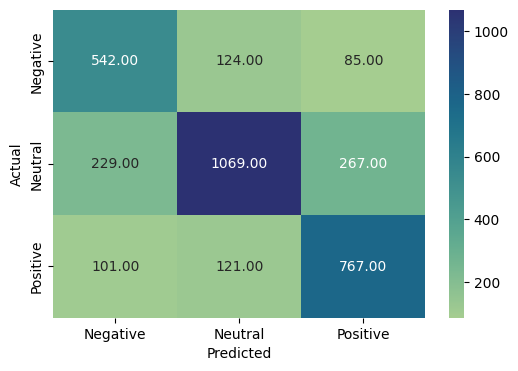

In [143]:
# Make predictions on the testing set
y_pred_bert_fin = finbert_model.predict(test_dataset.batch(16))

# Convert logits to predicted labels
y_pred_bert_labels_fin = np.argmax(y_pred_bert_fin.logits, axis=1)

# Evaluate the predictions
metrics_score(test_labels, y_pred_bert_labels_fin)

### Model Evaluation and Comparison

#### Traditional ML Modes

In [248]:
# function to calculate metrics
def calculate_metrics(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')  
    recall = recall_score(y_true, y_pred, average='weighted')        
    f1 = f1_score(y_true, y_pred, average='weighted')             
    return accuracy, precision, recall, f1

# Calculate the metrics for each model
models = [
    ("Bow_LogReg", y_pred_blr),
    ("Bow_SVM", y_pred_bsvm),
    ("Bow_XGBoost", y_pred_bxgb),
    ("Tf-Idf_LogReg", y_pred_tdlr),
    ("Tf-Idf_SVM", y_pred_tdsvm),
    ("Tf-Idf_XGB", y_pred_tdxgb),
    ("Ensemble_LogReg", y_pred_lrcbd),
    ("Ensemble_SVM", y_pred_svmcbd),
    ("Ensemble_XGB", y_pred_xgbcbd)
]

results = []
for model_name, y_pred in models:
    metrics = calculate_metrics(y_test, y_pred)
    results.append((model_name,) + metrics)

# put them in DataFrame
columns = ["Model", "Accuracy", "Precision", "Recall", "F1-Score"]
df_ml = pd.DataFrame(results, columns=columns)
df_ml

,Model,Accuracy,Precision,Recall,F1-Score
0,Bow_LogReg,0.741906,0.740815,0.741906,0.739598
1,Bow_SVM,0.736460,0.735127,0.736460,0.734840
2,Bow_XGBoost,0.714070,0.720350,0.714070,0.706996
3,Tf-Idf_LogReg,0.745840,0.745653,0.745840,0.743182
4,Tf-Idf_SVM,0.752799,0.753865,0.752799,0.749372
5,Tf-Idf_XGB,0.707716,0.714332,0.707716,0.700058
6,Ensemble_LogReg,0.745840,0.747665,0.745840,0.741741
7,Ensemble_SVM,0.753707,0.752703,0.753707,0.751673
8,Ensemble_XGB,0.707716,0.714332,0.707716,0.700058


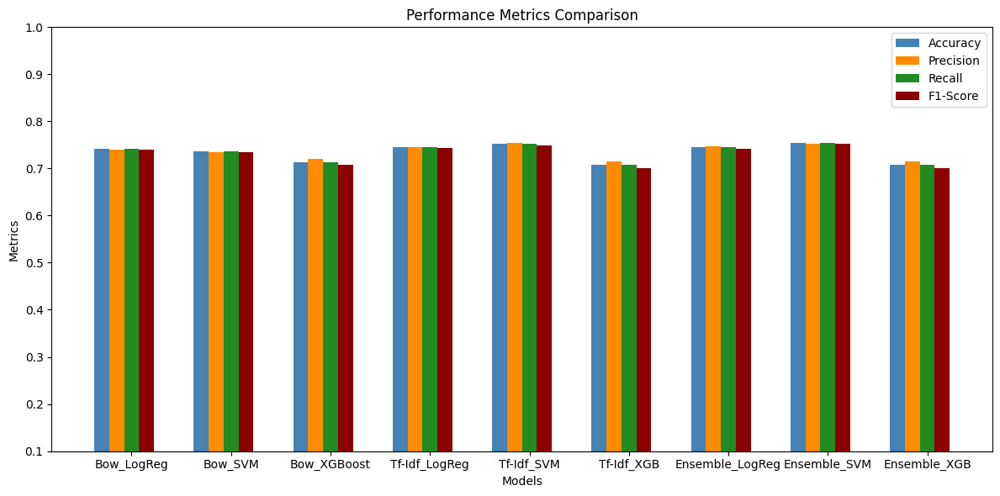

In [257]:
# Defining the models and metrics to plot from the dataframe (df)
models = df_ml['Model']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
colors = ['steelblue', 'darkorange', 'forestgreen', 'darkred']
# Set the width of the bars
bar_width = 0.15

# Set the position of the bars on the x-axis
r = np.arange(len(models))

# Create the bar plot
plt.figure(figsize=(12, 6))

for i, metric in enumerate(metrics):
    plt.bar(r + (i * bar_width), df_ml[metric], bar_width, label=metric, color=colors[i])

# Add labels, title, and ticks
plt.xlabel('Models')
plt.ylabel('Metrics')
plt.title('Performance Metrics Comparison')
plt.xticks(r + (bar_width * len(metrics) / 2), models)  # Adjusting the x-ticks position
plt.legend()
plt.tight_layout()

# Adjust the scale of the y-axis
plt.ylim(0.10, 1.0)  # Set the limits of the y-axis

# Show plot
plt.show()

#### NLP Models

In [251]:
def calculate_metrics(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')  
    recall = recall_score(y_true, y_pred, average='weighted')        
    f1 = f1_score(y_true, y_pred, average='weighted')             
    return accuracy, precision, recall, f1

# Calculate the metrics for each model
models = [
    ("BERT", y_pred_bert_labels_bt),
    ("RoBERT", y_pred_bert_labels_rob),
    ("FinBERT", y_pred_bert_labels_bt)
]

results = []
for model_name, y_pred in models:
    metrics = calculate_metrics(test_labels, y_pred)
    results.append((model_name,) + metrics)

# put them in DataFrame
columns = ["Model", "Accuracy", "Precision", "Recall", "F1-Score"]
df_nlp = pd.DataFrame(results, columns=columns)
df_nlp

,Model,Accuracy,Precision,Recall,F1-Score
0,BERT,0.732829,0.741040,0.732829,0.734668
1,RoBERT,0.761876,0.762104,0.761876,0.760963
2,FinBERT,0.732829,0.741040,0.732829,0.734668


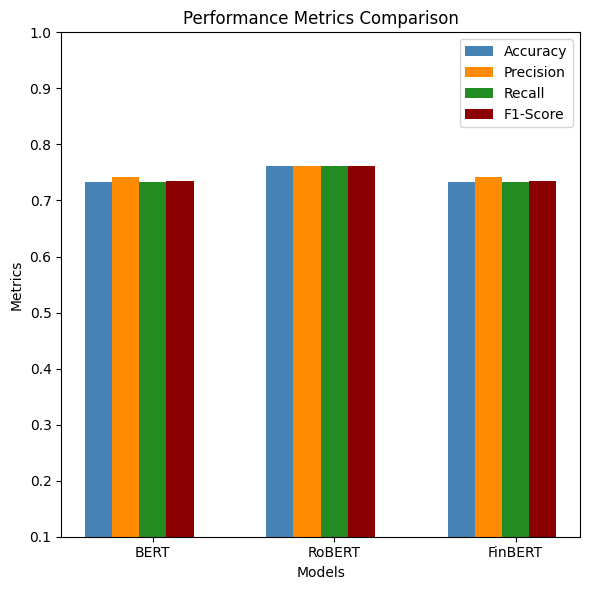

In [256]:
# Defining the models and metrics to plot from the dataframe (df)
models = df_nlp['Model']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
colors = ['steelblue', 'darkorange', 'forestgreen', 'darkred']

# Set the width of the bars
bar_width = 0.15

# Set the position of the bars on the x-axis
r = np.arange(len(models))

# Create the bar plot
plt.figure(figsize=(6, 6))

for i, metric in enumerate(metrics):
    plt.bar(r + (i * bar_width), df_nlp[metric], bar_width, label=metric, color=colors[i])

# Add labels, title, and ticks
plt.xlabel('Models')
plt.ylabel('Metrics')
plt.title('Performance Metrics Comparison')
plt.xticks(r + (bar_width * len(metrics) / 2), models)  # Adjusting the x-ticks position
plt.legend()
plt.tight_layout()

# Adjust the scale of the y-axis
plt.ylim(0.10, 1.0)  # Set the limits of the y-axis

# Show plot
plt.show()

### Model Explainability and Interpretability

#### SHAP with Traditional ML Models 

##### Logistic Regression

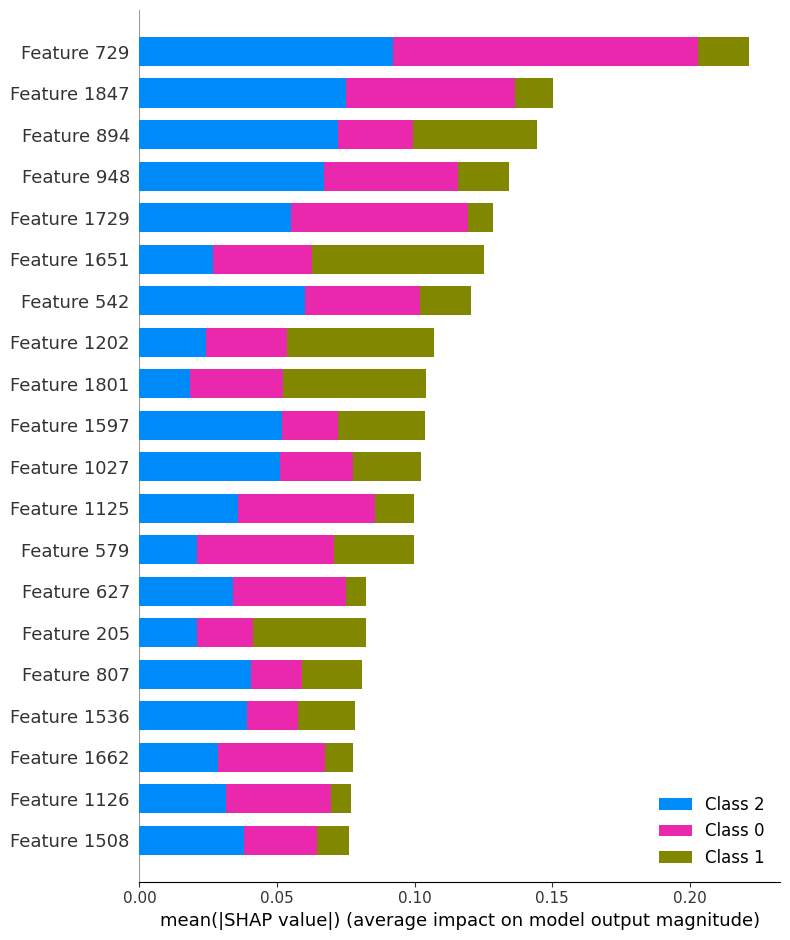

In [188]:

# Assuming `bow_lr` is your GridSearchCV object and it has been fitted
best_estimator = bow_lr.best_estimator_
explainers = shap.LinearExplainer(best_estimator, X_train, feature_perturbation="interventional")
shap_values = explainers.shap_values(X_test)
# Visualize the explanation
# shap.summary_plot(shap_values, X_test, feature_names=bow_vectorizer.get_feature_names_out())
shap.summary_plot(shap_values, X_test)

##### SVM

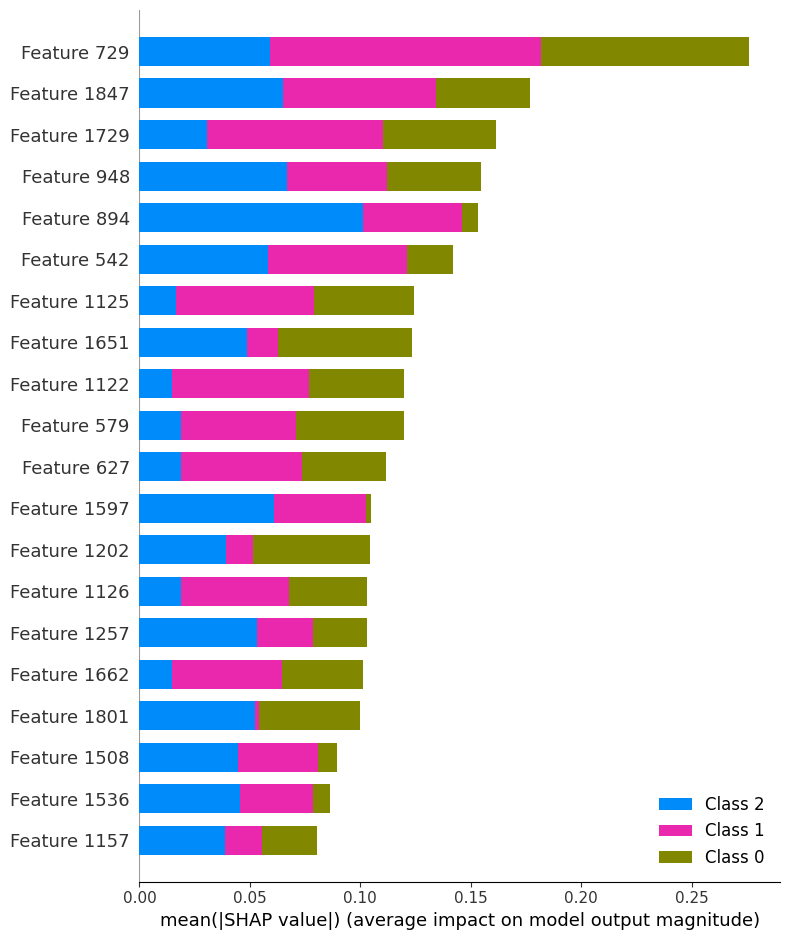

In [190]:

#get the best_estimator `svm_lr` 
best_estimator = bow_svm.best_estimator_
explainers = shap.LinearExplainer(best_estimator, X_train, feature_perturbation="interventional")
shap_values = explainers.shap_values(X_test)
# Visualize the explanation
shap.summary_plot(shap_values, X_test)

#### LIME with NLP Models

#### BERT

In [178]:
# Load BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Tokenize input text
train_encodings = tokenizer(list(train_text.values), truncation=True, padding=True)
val_encodings = tokenizer(list(val_text.values), truncation=True, padding=True)
test_encodings = tokenizer(list(test_text.values), truncation=True, padding=True)

# Create TensorFlow datasets
train_dataset = tf.data.Dataset.from_tensor_slices((
    dict(train_encodings),
    train_labels.astype(np.int32)  
))

val_dataset = tf.data.Dataset.from_tensor_slices((
    dict(val_encodings),
    val_labels.astype(np.int32)  
))

test_dataset = tf.data.Dataset.from_tensor_slices((
    dict(test_encodings),
    test_labels.astype(np.int32)  
))
# Define a function to predict probabilities using your model
def predict_probabilities(texts):
    # Tokenize text
    encodings = tokenizer(texts, truncation=True, padding=True)
    # Create a TensorFlow dataset
    dataset = tf.data.Dataset.from_tensor_slices((
        dict(encodings),
    ))
    # Predict
    predictions = bert_model.predict(dataset.batch(16))
    # Convert logits to probabilities
    probabilities = tf.nn.softmax(predictions.logits).numpy()
    return probabilities

# Initialize a LimeTextExplainer
explainer = LimeTextExplainer(class_names=['Negative', 'Neutral', 'Positive'])

# Choose an instance to explain
instance = test_text.iloc[5]

# Generate explanation
explanation = explainer.explain_instance(instance, predict_probabilities, num_features=6)

# Show explanation
explanation.show_in_notebook()

313/313 [==============================] - 39s 124ms/step


In [179]:
# Choose an instance to explain
instance = test_text.iloc[10]

# Generate explanation
explanation = explainer.explain_instance(instance, predict_probabilities, num_features=6)

# Show explanation
explanation.show_in_notebook()

313/313 [==============================] - 37s 118ms/step


In [180]:
# Choose an instance to explain
instance = test_text.iloc[100]

# Generate explanation
explanation = explainer.explain_instance(instance, predict_probabilities, num_features=6)

# Show explanation
explanation.show_in_notebook()

313/313 [==============================] - 32s 102ms/step


#### RoBERTa

In [181]:
# Load RoBERTa tokenizer
tokenizer = RobertaTokenizer.from_pretrained('roberta-base')

# Tokenize input text
train_encodings = tokenizer(list(train_text.values), truncation=True, padding=True)
val_encodings = tokenizer(list(val_text.values), truncation=True, padding=True)
test_encodings = tokenizer(list(test_text.values), truncation=True, padding=True)

# Create TensorFlow datasets
train_dataset = tf.data.Dataset.from_tensor_slices((
    dict(train_encodings),
    train_labels.astype(np.int32)  
))

val_dataset = tf.data.Dataset.from_tensor_slices((
    dict(val_encodings),
    val_labels.astype(np.int32)  
))

test_dataset = tf.data.Dataset.from_tensor_slices((
    dict(test_encodings),
    test_labels.astype(np.int32)  
))
# Define a function to predict probabilities using your model
def predict_probabilities(texts):
    # Tokenize text
    encodings = tokenizer(texts, truncation=True, padding=True)
    # Create a TensorFlow dataset
    dataset = tf.data.Dataset.from_tensor_slices((
        dict(encodings),
    ))
    # Predict
    predictions = roberta_model.predict(dataset.batch(16))
    # Convert logits to probabilities
    probabilities = tf.nn.softmax(predictions.logits).numpy()
    return probabilities

# Initialize a LimeTextExplainer
explainer = LimeTextExplainer(class_names=['Negative', 'Neutral', 'Positive'])

# Choose an instance to explain
instance = test_text.iloc[5]

# Generate explanation
explanation = explainer.explain_instance(instance, predict_probabilities, num_features=6)

# Show explanation
explanation.show_in_notebook()


313/313 [==============================] - 38s 121ms/step


In [182]:
# Choose an instance to explain
instance = test_text.iloc[10]

# Generate explanation
explanation = explainer.explain_instance(instance, predict_probabilities, num_features=6)

# Show explanation
explanation.show_in_notebook()

313/313 [==============================] - 38s 122ms/step


In [183]:
# Choose an instance to explain
instance = test_text.iloc[100]

# Generate explanation
explanation = explainer.explain_instance(instance, predict_probabilities, num_features=6)

# Show explanation
explanation.show_in_notebook()

313/313 [==============================] - 34s 109ms/step


#### FinBERT

In [175]:
# Load FinBERT tokenizer
tokenizer = BertTokenizer.from_pretrained('yiyanghkust/finbert-tone')

# Tokenize input text
train_encodings = tokenizer(list(train_text.values), truncation=True, padding=True)
val_encodings = tokenizer(list(val_text.values), truncation=True, padding=True)
test_encodings = tokenizer(list(test_text.values), truncation=True, padding=True)

# Create TensorFlow datasets
train_dataset = tf.data.Dataset.from_tensor_slices((
    dict(train_encodings),
    train_labels.astype(np.int32)  
))

val_dataset = tf.data.Dataset.from_tensor_slices((
    dict(val_encodings),
    val_labels.astype(np.int32) 
))

test_dataset = tf.data.Dataset.from_tensor_slices((
    dict(test_encodings),
    test_labels.astype(np.int32)  
))
# Define a function to predict probabilities using your model
def predict_probabilities(texts):
    # Tokenize text
    encodings = tokenizer(texts, truncation=True, padding=True)
    # Create a TensorFlow dataset
    dataset = tf.data.Dataset.from_tensor_slices((
        dict(encodings),
    ))
    # Predict
    predictions = finbert_model.predict(dataset.batch(16))
    # Convert logits to probabilities
    probabilities = tf.nn.softmax(predictions.logits).numpy()
    return probabilities

# Initialize a LimeTextExplainer
explainer = LimeTextExplainer(class_names=['Negative', 'Neutral', 'Positive'])

# Choose an instance to explain
instance = test_text.iloc[5]

# Generate explanation
explanation = explainer.explain_instance(instance, predict_probabilities, num_features=6)

# Show explanation
explanation.show_in_notebook()


Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


313/313 [==============================] - 35s 111ms/step


In [176]:
# Choose an instance to explain
instance = test_text.iloc[10]

# Generate explanation
explanation = explainer.explain_instance(instance, predict_probabilities, num_features=6)

# Show explanation
explanation.show_in_notebook()


313/313 [==============================] - 33s 106ms/step


In [177]:
# Choose an instance to explain
instance = test_text.iloc[100]

# Generate explanation
explanation = explainer.explain_instance(instance, predict_probabilities, num_features=6)

# Show explanation
explanation.show_in_notebook()

313/313 [==============================] - 33s 106ms/step


### Saving Models and ready for Deployments

In [259]:
# put the models in a dictionary
models = {
    'bow_lr': bow_lr,
    'bow_svm': bow_svm,
    'bow_xgb': bow_xgb,
    'tdidf_lr': tdidf_lr,
    'tdidf_svm': tdidf_svm,
    'tdidf_xgb': tdidf_xgb,
    'lr_combined': lr_combined,
    'svm_combined': svm_combined,
    'xgb_combined': xgb_combined,

}

for model_name, model in models.items():
    with open(f'{model_name}.pkl', 'wb') as f:
        pickle.dump(model, f)

In [260]:
# saving the nlp modeld
bert_model.save_pretrained('./bert_model')
roberta_model.save_pretrained('./roberta_model')
finbert_model.save_pretrained('./finbert_model')
